In [1]:
# import required python libraries
#import geopandas as gpd  # for geo-data structure
import numpy as np  # for some operation better done with numpy
import matplotlib.pyplot as plt  # for creating plots
#import shapely.geometry  # for geometry data crunching
#from shapely.geometry import Point  # specifically for point geometry data manipulation
#import keplergl
#from keplergl import KeplerGl
import pandas as pd
crs = {'init': 'epsg:4326'}
#from shapely.geometry import Point
import mpl_toolkits


In [69]:
SL_g = pd.read_csv('./data/coverage_Sierra_Leone_GSMA_V2.csv',low_memory=False,encoding='utf-8')

In [63]:
SL_itu = pd.read_csv('./data/sierra_leone_school_coverage_ITU.csv',low_memory=False,encoding='utf-8')

In [64]:
SL_itu.head()

,uuid,country,source,school_id,giga_school_id,name,education_level,lat,lon,hex8,...,Schools_within_3km,Schools_within_10km,nearest_celltower_id,nearest_celltower_distance,2G,3G,4G,pop_within_1km,pop_within_3km,pop_within_7km
0,b4218644-52aa-3da9-8bfd-b60ef9e60912,Sierra Leone,government,NaN,G_SL_000001,BADRUDEEN ISLAMIC PRIMARY SCHOOL,Primary,7.988612,-10.64796,8875b084a9fffff,...,24,293,334,12.171508,1,0,0,4848,35964,188977
1,84b52390-a1a8-3e1d-b2f3-1bebde50f350,Sierra Leone,government,NaN,G_SL_000002,KAILAHUNTER DISTRICT EDUCATION COMMITTEE PRIMA...,Primary,7.822542,-10.92325,8875b00213fffff,...,22,697,295,19.032151,1,0,0,5974,30875,202648
2,70074963-6cd0-3cd8-a574-78e5acbfefb8,Sierra Leone,government,NaN,G_SL_000003,BADRUDIEN ISLAMIC PRIMARY SCHOOL,Primary,8.282627,-10.37537,8875b5533dfffff,...,51,211,225,20.184328,1,0,0,21535,64975,197856
3,e734f64f-4ad4-3a17-9d55-9e032a6cca5e,Sierra Leone,government,NaN,G_SL_000004,KAILAHUN DISTRICT EDUCATION COMMITTEE PRE-...,Primary,8.283335,-10.37064,8875b55339fffff,...,52,211,225,20.707004,1,0,0,21834,64932,194285
4,bbc80ca5-4e5f-3896-b1f3-6c2f87f5b61e,Sierra Leone,government,NaN,G_SL_000005,KAILAHUN DISTRICT EDUCATION COMMITTEE PRIM...,Primary,8.206346,-10.34603,8875b550a5fffff,...,32,207,225,24.750885,0,0,0,7381,51201,129553


In [65]:
SL_itu['2G'].value_counts()

1    9883
0    1010
Name: 2G, dtype: int64

In [66]:
SL_itu.isna().mean()*100

uuid                           0.000000
country                        0.000000
source                         0.000000
school_id                      4.590104
giga_school_id                 0.000000
name                           0.000000
education_level                0.000000
lat                            0.000000
lon                            0.000000
hex8                           0.000000
dq_score                       0.000000
source_timestamp               0.000000
master_timestamp               0.000000
school_archive                 0.000000
electricity_availability       0.000000
connectivity                   0.000000
student_count                  0.000000
teacher_count                  0.000000
computer_count                96.382998
computer_lab                   0.000000
fiber_node_distance            0.000000
nearest_school_distance        0.000000
Schools_within_1km             0.000000
Schools_within_3km             0.000000
Schools_within_10km            0.000000


In [27]:
SL_g.head()

,sn,source_sch,school_nam,school_cat,school_set,district,sector,cell,village,latitude,...,internet_a,num_studen,num_teache,computers,uuid,connectivi,giga_schoo,2G,3G,4G
0,1,430710.0,GS MURAMA,PUBLIC,12 YBE,RUTSIRO,MASASA,GABIRO,GABIRO,-1.973667,...,USB_MODEM,21,1,323.0,9701a58f-8724-4e63-b665-a6bc51eab7f9,3G,G_RWA_00001,3.0,3.0,3.0
1,2,521312.0,GS MUHORORO,PUBLIC,12 YBE,KARONGI,MURAMBI,MUHORORO,BWAKIRA,-2.159389,...,USB_MODEM,28,1,260.0,cdf4f80c-e3cc-4ebc-8931-8fe76018cc61,3G,G_RWA_00002,3.0,NaN,3.0
2,3,120515.0,GS MWENDO,PUBLIC,12 YBE,RUHANGO,MWENDO,GAFUNZO,NYAMIGINA,-2.166806,...,USB_MODEM,43,1,217.0,ce94c79c-882e-4f64-a1d8-fcb73add4f84,3G,G_RWA_00003,3.0,3.0,3.0
3,4,120122.0,GS KIMISANGE,PUBLIC,12 YBE,KICUKIRO,KIGARAMA,BWERANKORI,NYENYERI,-1.989889,...,USB_MODEM,47,3,251.0,a80c737c-322a-4874-ab0b-ca4eb68d1507,3G,G_RWA_00004,3.0,3.0,3.0
4,5,331220.0,GS MWENDO,PUBLIC,12 YBE,GICUMBI,MUKO,MWENDO,KAGOGO,-1.730639,...,USB_MODEM,62,3,272.0,a58be9dc-59c4-4cf9-96f5-e5b8fa84ba82,3G,G_RWA_00005,3.0,NaN,3.0


In [70]:
SL_g.columns

Index(['uuid', 'country', 'source', 'giga_school_id', 'school_id', 'name',
       'education_level', 'lat', 'lon', 'hex8', 'dq_score', 'source_timestamp',
       'master_timestamp', 'school_archive', 'electricity_availability',
       'connectivity_availability', 'num_students', 'num_teachers',
       'num_computers', 'computer_lab', 'School_connectivity.gpkg_fid', '4G',
       '3G', '2G'],
      dtype='object')

<AxesSubplot:>

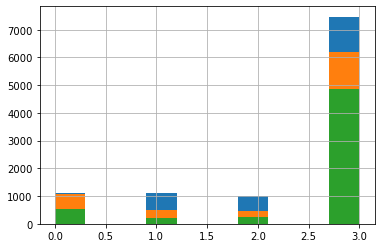

In [71]:
SL_g['2G'].hist(bins=10)
SL_g['3G'].hist(bins=10)
SL_g['4G'].hist(bins=10)

In [72]:
SL_g.isna().mean()*100

uuid                             0.000000
country                          0.000000
source                           0.000000
giga_school_id                   0.000000
school_id                        4.590104
name                             0.000000
education_level                  0.000000
lat                              0.000000
lon                              0.000000
hex8                             0.000000
dq_score                         0.000000
source_timestamp                 0.000000
master_timestamp                 0.000000
school_archive                   0.000000
electricity_availability         0.000000
connectivity_availability        0.000000
num_students                     0.000000
num_teachers                     0.000000
num_computers                   96.382998
computer_lab                     0.000000
School_connectivity.gpkg_fid     0.000000
4G                              46.534472
3G                              24.336730
2G                               1

In [73]:
SL_itu.columns

Index(['uuid', 'country', 'source', 'school_id', 'giga_school_id', 'name',
       'education_level', 'lat', 'lon', 'hex8', 'dq_score', 'source_timestamp',
       'master_timestamp', 'school_archive', 'electricity_availability',
       'connectivity', 'student_count', 'teacher_count', 'computer_count',
       'computer_lab', 'fiber_node_distance', 'nearest_school_distance',
       'Schools_within_1km', 'Schools_within_3km', 'Schools_within_10km',
       'nearest_celltower_id', 'nearest_celltower_distance', '2G', '3G', '4G',
       'pop_within_1km', 'pop_within_3km', 'pop_within_7km'],
      dtype='object')

In [74]:
SL_itu['coverage'] = np.where((SL_itu['2G'].isnull()) & (SL_itu['3G'].isnull())& (SL_itu['4G'].isnull()), 'NO', 'YES')
SL_itu['coverage'] = np.where((SL_itu['2G']<=0) & (SL_itu['3G']<=0) & (SL_itu['4G']<=0), 'NO', 'YES')

In [75]:
SL_itu['coverage'].unique()

array(['YES', 'NO'], dtype=object)

In [76]:
SL_itu['coverage'].value_counts()

YES    9883
NO     1010
Name: coverage, dtype: int64

In [77]:
SL_g['coverage'] = np.where((SL_g['2G'].isnull()) & (SL_g['3G'].isnull())& (SL_g['4G'].isnull()), 'NO', 'YES')


In [78]:
SL_g['coverage'].unique()

array(['YES', 'NO'], dtype=object)

In [79]:
SL_g['coverage'].value_counts()

YES    10716
NO       177
Name: coverage, dtype: int64

In [80]:
SL_g['2G_coverage'] = np.where((SL_g['2G'] > 0), 'YES', 'NO')
SL_g['3G_coverage'] = np.where((SL_g['3G'] > 0), 'YES', 'NO')
SL_g['4G_coverage'] = np.where((SL_g['4G'] > 0), 'YES', 'NO')

In [81]:
SL_itu['2G_coverage'] = np.where((SL_itu['2G'] >=1), 'YES', 'NO')
SL_itu['3G_coverage'] = np.where((SL_itu['3G'] == 1), 'YES', 'NO')
SL_itu['4G_coverage'] = np.where((SL_itu['4G'] ==1), 'YES', 'NO')

In [82]:
SL_itu['2G_coverage'].value_counts()

YES    9883
NO     1010
Name: 2G_coverage, dtype: int64

In [83]:
SL_itu.columns

Index(['uuid', 'country', 'source', 'school_id', 'giga_school_id', 'name',
       'education_level', 'lat', 'lon', 'hex8', 'dq_score', 'source_timestamp',
       'master_timestamp', 'school_archive', 'electricity_availability',
       'connectivity', 'student_count', 'teacher_count', 'computer_count',
       'computer_lab', 'fiber_node_distance', 'nearest_school_distance',
       'Schools_within_1km', 'Schools_within_3km', 'Schools_within_10km',
       'nearest_celltower_id', 'nearest_celltower_distance', '2G', '3G', '4G',
       'pop_within_1km', 'pop_within_3km', 'pop_within_7km', 'coverage',
       '2G_coverage', '3G_coverage', '4G_coverage'],
      dtype='object')

In [84]:
SL_itu.head()

,uuid,country,source,school_id,giga_school_id,name,education_level,lat,lon,hex8,...,2G,3G,4G,pop_within_1km,pop_within_3km,pop_within_7km,coverage,2G_coverage,3G_coverage,4G_coverage
0,b4218644-52aa-3da9-8bfd-b60ef9e60912,Sierra Leone,government,NaN,G_SL_000001,BADRUDEEN ISLAMIC PRIMARY SCHOOL,Primary,7.988612,-10.64796,8875b084a9fffff,...,1,0,0,4848,35964,188977,YES,YES,NO,NO
1,84b52390-a1a8-3e1d-b2f3-1bebde50f350,Sierra Leone,government,NaN,G_SL_000002,KAILAHUNTER DISTRICT EDUCATION COMMITTEE PRIMA...,Primary,7.822542,-10.92325,8875b00213fffff,...,1,0,0,5974,30875,202648,YES,YES,NO,NO
2,70074963-6cd0-3cd8-a574-78e5acbfefb8,Sierra Leone,government,NaN,G_SL_000003,BADRUDIEN ISLAMIC PRIMARY SCHOOL,Primary,8.282627,-10.37537,8875b5533dfffff,...,1,0,0,21535,64975,197856,YES,YES,NO,NO
3,e734f64f-4ad4-3a17-9d55-9e032a6cca5e,Sierra Leone,government,NaN,G_SL_000004,KAILAHUN DISTRICT EDUCATION COMMITTEE PRE-...,Primary,8.283335,-10.37064,8875b55339fffff,...,1,0,0,21834,64932,194285,YES,YES,NO,NO
4,bbc80ca5-4e5f-3896-b1f3-6c2f87f5b61e,Sierra Leone,government,NaN,G_SL_000005,KAILAHUN DISTRICT EDUCATION COMMITTEE PRIM...,Primary,8.206346,-10.34603,8875b550a5fffff,...,0,0,0,7381,51201,129553,NO,NO,NO,NO


In [85]:
def coverage_type(df):
    if df['4G_coverage'] == 'YES':
        return "4G"
    elif df['3G_coverage'] == 'YES':
        return "3G"
    elif df['2G_coverage'] == 'YES':
        return "2G"
    else:
        return "None"

In [86]:
SL_g['coverage_type'] = SL_g.apply((lambda x: coverage_type(x)),axis=1)

In [87]:
SL_itu['coverage_type'] = SL_itu.apply((lambda x: coverage_type(x)),axis=1)

In [88]:
SL_itu['coverage_type'].unique()

array(['2G', 'None', '3G', '4G'], dtype=object)

In [89]:
SL_itu[SL_itu['coverage_type']=='None']

,uuid,country,source,school_id,giga_school_id,name,education_level,lat,lon,hex8,...,3G,4G,pop_within_1km,pop_within_3km,pop_within_7km,coverage,2G_coverage,3G_coverage,4G_coverage,coverage_type
4,bbc80ca5-4e5f-3896-b1f3-6c2f87f5b61e,Sierra Leone,government,NaN,G_SL_000005,KAILAHUN DISTRICT EDUCATION COMMITTEE PRIM...,Primary,8.206346,-10.34603,8875b550a5fffff,...,0,0,7381,51201,129553,NO,NO,NO,NO,None
5,25f2152e-99b2-356c-969a-ef3d417e998b,Sierra Leone,government,NaN,G_SL_000006,KAILAHUN DISTRICT EDUCATION COMMITTEE PRIMA...,Primary,8.170468,-10.35651,8875b54205fffff,...,0,0,4377,26864,112449,NO,NO,NO,NO,None
6,f1e92c26-d024-3374-bc2c-815e815a6105,Sierra Leone,government,NaN,G_SL_000007,MAKPADU COMMUNITY PRIMARY SCHOOL,Primary,8.235952,-10.32845,8875b55013fffff,...,0,0,9984,54026,134481,NO,NO,NO,NO,None
18,e4082e4d-978f-3450-bd6f-048ab6656dd5,Sierra Leone,government,NaN,G_SL_000019,UNITED ISLAMIC PRIMARY SCHOOL,Primary,7.660082,-11.18757,8875b07329fffff,...,0,0,1503,23661,233025,NO,NO,NO,NO,None
46,40133a2e-2304-3cc3-82ab-9fa341eba58a,Sierra Leone,government,NaN,G_SL_000047,CHARITABLE COMMUNITY PRIMARY SCHOOL,Primary,7.620267,-11.32312,8875b07b61fffff,...,0,0,966,21109,118065,NO,NO,NO,NO,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8354,ba13cdb0-627e-3113-a4dd-03c0cf57486a,Sierra Leone,government,340203201.0,G_SL_008355,ISLAMIC CALL SOCIETY PRIMARY SCHOOL (DABENI S...,Primary,7.274909,-11.55220,8875b3d96bfffff,...,0,0,7943,34326,189622,NO,NO,NO,NO,None
8358,fa4687c5-2fba-3eab-99d0-06f6ee70343e,Sierra Leone,government,340203216.0,G_SL_008359,PUJEHUN DISTRICT COUNCIL PRIMARY SCHOOL (KEMO...,Primary,7.270770,-11.52637,8875b3d951fffff,...,0,0,6093,33525,171467,NO,NO,NO,NO,None
8359,2b50882a-35cc-31a3-907d-f20181d02b9b,Sierra Leone,government,340203214.0,G_SL_008360,ROMAN CATHOLIC PRIMARY SCHOOL (JAKEMA SECTION...,Primary,7.211570,-11.55420,8875b23699fffff,...,0,0,3348,25238,158628,NO,NO,NO,NO,None
8434,8228b000-b301-35db-8138-4195724f901e,Sierra Leone,government,341201202.0,G_SL_008435,SIERRA LEONE CHURCH (SIERRA LEONE CHURCH SECT...,Primary,7.170769,-11.75718,8875b22055fffff,...,0,0,2771,18033,119805,NO,NO,NO,NO,None


In [90]:
SL_g.columns

Index(['uuid', 'country', 'source', 'giga_school_id', 'school_id', 'name',
       'education_level', 'lat', 'lon', 'hex8', 'dq_score', 'source_timestamp',
       'master_timestamp', 'school_archive', 'electricity_availability',
       'connectivity_availability', 'num_students', 'num_teachers',
       'num_computers', 'computer_lab', 'School_connectivity.gpkg_fid', '4G',
       '3G', '2G', 'coverage', '2G_coverage', '3G_coverage', '4G_coverage',
       'coverage_type'],
      dtype='object')

In [91]:
SL_g.rename(columns={'giga_schoo':'giga_school_id', 'school_nam':'name'}, inplace=True)

In [92]:
features = ['giga_school_id','name','2G_coverage','3G_coverage','4G_coverage','coverage','coverage_type'] 

In [93]:
SL_gc = SL_g[features]

In [94]:
SL_it = SL_itu[features]

In [95]:
SL_gc.head()

,giga_school_id,name,2G_coverage,3G_coverage,4G_coverage,coverage,coverage_type
0,G_SL_000001,BADRUDEEN ISLAMIC PRIMARY SCHOOL,YES,NO,NO,YES,2G
1,G_SL_000002,KAILAHUNTER DISTRICT EDUCATION COMMITTEE PRIMA...,NO,NO,NO,YES,None
2,G_SL_000003,BADRUDIEN ISLAMIC PRIMARY SCHOOL,YES,NO,NO,YES,2G
3,G_SL_000004,KAILAHUN DISTRICT EDUCATION COMMITTEE PRE-...,YES,NO,NO,YES,2G
4,G_SL_000005,KAILAHUN DISTRICT EDUCATION COMMITTEE PRIM...,NO,NO,NO,YES,None


In [96]:
SL_it.head()

,giga_school_id,name,2G_coverage,3G_coverage,4G_coverage,coverage,coverage_type
0,G_SL_000001,BADRUDEEN ISLAMIC PRIMARY SCHOOL,YES,NO,NO,YES,2G
1,G_SL_000002,KAILAHUNTER DISTRICT EDUCATION COMMITTEE PRIMA...,YES,NO,NO,YES,2G
2,G_SL_000003,BADRUDIEN ISLAMIC PRIMARY SCHOOL,YES,NO,NO,YES,2G
3,G_SL_000004,KAILAHUN DISTRICT EDUCATION COMMITTEE PRE-...,YES,NO,NO,YES,2G
4,G_SL_000005,KAILAHUN DISTRICT EDUCATION COMMITTEE PRIM...,NO,NO,NO,NO,None


In [32]:
#RW_c_sub.loc[RW_c_sub['coverage_type'].isin(['4G','3G', '2G']), 'coverage'] = 'YES'

In [33]:
#RW_c_sub.loc[RW_c_sub['coverage_type'].isin(['No']), 'coverage'] = 'NO'

In [34]:
#cov_val = ['4G','3G', '2G','No']

In [35]:
#RW_c_sub.loc[~RW_c_sub['coverage_type'].isin(cov_val), 'coverage'] = np.nan

In [36]:
#RW_c_sub.head()

In [37]:
# using compare function
#df1.compare(df2)

In [99]:
SL_gc = SL_gc[SL_gc['giga_school_id'].notna()]

In [100]:
SL_it = SL_it[SL_it['giga_school_id'].notna()]

In [101]:
SL_gc.isna().mean()*100

giga_school_id    0.0
name              0.0
2G_coverage       0.0
3G_coverage       0.0
4G_coverage       0.0
coverage          0.0
coverage_type     0.0
dtype: float64

In [102]:
SL_it.isna().mean()*100

giga_school_id    0.0
name              0.0
2G_coverage       0.0
3G_coverage       0.0
4G_coverage       0.0
coverage          0.0
coverage_type     0.0
dtype: float64

In [104]:
df_all = pd.concat([SL_gc.set_index('giga_school_id'), SL_it.set_index('giga_school_id')], 
                   axis='columns', keys=['GSMA', 'ITU'])
df_all

GSMA              \
                                                             name 2G_coverage   
giga_school_id                                                                  
G_SL_000001                      BADRUDEEN ISLAMIC PRIMARY SCHOOL         YES   
G_SL_000002     KAILAHUNTER DISTRICT EDUCATION COMMITTEE PRIMA...          NO   
G_SL_000003                    BADRUDIEN ISLAMIC  PRIMARY  SCHOOL         YES   
G_SL_000004     KAILAHUN  DISTRICT  EDUCATION  COMMITTEE  PRE-...         YES   
G_SL_000005     KAILAHUN  DISTRICT  EDUCATION  COMMITTEE  PRIM...          NO   
...                                                           ...         ...   
G_SL_010889     WILBERFORCE PRIMARY MUNICIPAL SCHOOL -  INFANT...         YES   
G_SL_010890     WILBERFORCE PRIMARY MUNICIPAL SCHOOL INFANTS  ...         YES   
G_SL_010891     WONDERLAND NURSERY AND PREPARATORY SCHOOL  (MU...         YES   
G_SL_010892     WONDERS INTERNATIONAL  ACADEMY PRESCHOOL  (HIL...         YES   
G_SL_010893     WONDERS INTERNATIONAL ACADEMY PREPARATORY SCHO...         YES   

                                                               \
               3G_coverage 4G_coverage coverage coverage_type   
giga_school_id                                                  
G_SL_000001             NO          NO      YES            2G   
G_SL_000002             NO          NO      YES          None   
G_SL_000003             NO          NO      YES            2G   
G_SL_000004             NO          NO      YES            2G   
G_SL_000005             NO          NO      YES          None   
...                    ...         ...      ...           ...   
G_SL_010889            YES         YES      YES            4G   
G_SL_010890            YES         YES      YES            4G   
G_SL_010891            YES         YES      YES            4G   
G_SL_010892            YES         YES      YES            4G   
G_SL_010893            YES         YES      YES            4G   

                                                              ITU              \
                                                             name 2G_coverage   
giga_school_id                                                                  
G_SL_000001                      BADRUDEEN ISLAMIC PRIMARY SCHOOL         YES   
G_SL_000002     KAILAHUNTER DISTRICT EDUCATION COMMITTEE PRIMA...         YES   
G_SL_000003                    BADRUDIEN ISLAMIC  PRIMARY  SCHOOL         YES   
G_SL_000004     KAILAHUN  DISTRICT  EDUCATION  COMMITTEE  PRE-...         YES   
G_SL_000005     KAILAHUN  DISTRICT  EDUCATION  COMMITTEE  PRIM...          NO   
...                                                           ...         ...   
G_SL_010889     WILBERFORCE PRIMARY MUNICIPAL SCHOOL -  INFANT...         YES   
G_SL_010890     WILBERFORCE PRIMARY MUNICIPAL SCHOOL INFANTS  ...         YES   
G_SL_010891     WONDERLAND NURSERY AND PREPARATORY SCHOOL  (MU...         YES   
G_SL_010892     WONDERS INTERNATIONAL  ACADEMY PRESCHOOL  (HIL...         YES   
G_SL_010893     WONDERS INTERNATIONAL ACADEMY PREPARATORY SCHO...         YES   

                                                               
               3G_coverage 4G_coverage coverage coverage_type  
giga_school_id                                                 
G_SL_000001             NO          NO      YES            2G  
G_SL_000002             NO          NO      YES            2G  
G_SL_000003             NO          NO      YES            2G  
G_SL_000004             NO          NO      YES            2G  
G_SL_000005             NO          NO       NO          None  
...                    ...         ...      ...           ...  
G_SL_010889            YES         YES      YES            4G  
G_SL_010890            YES         YES      YES            4G  
G_SL_010891            YES         YES      YES            4G  
G_SL_010892            YES         YES      YES            4G  
G_SL_010893            YES         YES      YES 

In [105]:
df_final = df_all.swaplevel(axis='columns')[SL_gc.columns[1:]]
df_final

name  \
                                                             GSMA   
giga_school_id                                                      
G_SL_000001                      BADRUDEEN ISLAMIC PRIMARY SCHOOL   
G_SL_000002     KAILAHUNTER DISTRICT EDUCATION COMMITTEE PRIMA...   
G_SL_000003                    BADRUDIEN ISLAMIC  PRIMARY  SCHOOL   
G_SL_000004     KAILAHUN  DISTRICT  EDUCATION  COMMITTEE  PRE-...   
G_SL_000005     KAILAHUN  DISTRICT  EDUCATION  COMMITTEE  PRIM...   
...                                                           ...   
G_SL_010889     WILBERFORCE PRIMARY MUNICIPAL SCHOOL -  INFANT...   
G_SL_010890     WILBERFORCE PRIMARY MUNICIPAL SCHOOL INFANTS  ...   
G_SL_010891     WONDERLAND NURSERY AND PREPARATORY SCHOOL  (MU...   
G_SL_010892     WONDERS INTERNATIONAL  ACADEMY PRESCHOOL  (HIL...   
G_SL_010893     WONDERS INTERNATIONAL ACADEMY PREPARATORY SCHO...   

                                                                  2G_coverage  \
                                                              ITU        GSMA   
giga_school_id                                                                  
G_SL_000001                      BADRUDEEN ISLAMIC PRIMARY SCHOOL         YES   
G_SL_000002     KAILAHUNTER DISTRICT EDUCATION COMMITTEE PRIMA...          NO   
G_SL_000003                    BADRUDIEN ISLAMIC  PRIMARY  SCHOOL         YES   
G_SL_000004     KAILAHUN  DISTRICT  EDUCATION  COMMITTEE  PRE-...         YES   
G_SL_000005     KAILAHUN  DISTRICT  EDUCATION  COMMITTEE  PRIM...          NO   
...                                                           ...         ...   
G_SL_010889     WILBERFORCE PRIMARY MUNICIPAL SCHOOL -  INFANT...         YES   
G_SL_010890     WILBERFORCE PRIMARY MUNICIPAL SCHOOL INFANTS  ...         YES   
G_SL_010891     WONDERLAND NURSERY AND PREPARATORY SCHOOL  (MU...         YES   
G_SL_010892     WONDERS INTERNATIONAL  ACADEMY PRESCHOOL  (HIL...         YES   
G_SL_010893     WONDERS INTERNATIONAL ACADEMY PREPARATORY SCHO...         YES   

                    3G_coverage      4G_coverage      coverage       \
                ITU        GSMA  ITU        GSMA  ITU     GSMA  ITU   
giga_school_id                                                        
G_SL_000001     YES          NO   NO          NO   NO      YES  YES   
G_SL_000002     YES          NO   NO          NO   NO      YES  YES   
G_SL_000003     YES          NO   NO          NO   NO      YES  YES   
G_SL_000004     YES          NO   NO          NO   NO      YES  YES   
G_SL_000005      NO          NO   NO          NO   NO      YES   NO   
...             ...         ...  ...         ...  ...      ...  ...   
G_SL_010889     YES         YES  YES         YES  YES      YES  YES   
G_SL_010890     YES         YES  YES         YES  YES      YES  YES   
G_SL_010891     YES         YES  YES         YES  YES      YES  YES   
G_SL_010892     YES         YES  YES         YES  YES      YES  YES   
G_SL_010893     YES         YES  YES         YES  YES      YES  YES   

               coverage_type        
                        GSMA   ITU  
giga_school_id                      
G_SL_000001               2G    2G  
G_SL_000002             None    2G  
G_SL_000003               2G    2G  
G_SL_000004               2G    2G  
G_SL_000005             None  None  
...                      ...   ...  
G_SL_010889               4G    4G  
G_SL_010890               4G    4G  
G_SL_010891               4G    4G  
G_SL_010892               4G    4G  
G_SL_010893               4G    4G  

[10893 rows x 12 columns]

In [106]:
def highlight_diff(data, color='lightcoral'):
    attr = 'background-color: {}'.format(color)
    other = data.xs('GSMA', axis='columns', level=-1)
    return pd.DataFrame(np.where(data.ne(other, level=0), attr, ''),
                        index=data.index, columns=data.columns)

df_final.style.apply(highlight_diff, axis=None)

In [ ]:
#df_ff = diff_pd(RW_f,RW_ec)

In [107]:
df_diff_c = pd.concat([SL_gc,SL_it])

In [108]:
SL_gc.shape

(10893, 7)

In [109]:
SL_it.shape

(10893, 7)

In [110]:
df_diff_c.shape

(21786, 7)

In [111]:
df_diff = pd.concat([SL_it,df_diff_c]).drop_duplicates(subset=['giga_school_id','coverage'], keep=False)

In [112]:
df_diff.shape

(905, 7)

In [113]:
df_diff.head()

,giga_school_id,name,2G_coverage,3G_coverage,4G_coverage,coverage,coverage_type
4,G_SL_000005,KAILAHUN DISTRICT EDUCATION COMMITTEE PRIM...,NO,NO,NO,YES,None
5,G_SL_000006,KAILAHUN DISTRICT EDUCATION COMMITTEE PRIMA...,YES,YES,NO,YES,3G
6,G_SL_000007,MAKPADU COMMUNITY PRIMARY SCHOOL,NO,NO,NO,YES,None
18,G_SL_000019,UNITED ISLAMIC PRIMARY SCHOOL,NO,NO,NO,YES,None
56,G_SL_000057,ROMAN CATHOLIC PRIMARY SCHOOL KONGOHUN,NO,NO,NO,YES,None


In [114]:
10893-905

9988

In [115]:
(9988/10893)*100

91.69191223721657

In [67]:
# 92% match for ITU data

In [ ]:
sample_data = df_diff.head(20)

In [ ]:
sample_data.to_csv('sample_data.csv')

In [ ]:
mode = lambda x: x.mode() if len(x) > 2 else np.array(x)
df.groupby('tag')['category'].agg(mode)